  
# **STAGE 5. EXPLORATORY DATA ANALYSIS**

### Import Libraries

---

In [1]:
# Data manipulation
import pandas as pd
import numpy as np

# Data Visualizations
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Time series 
import datetime
import statsmodels.api as sm

### Import Data

---

In [2]:
data_path = 'D:/Data_Science_Project/7. Time series analysis/Project 2 - Analysis of power consumption/power_consumption_filter.csv'

In [3]:
# Загрузим набор даннх для первичного визуального анализа 
power_consumption_filter = pd.read_csv(data_path)

# Преобразование даты 
power_consumption_filter['date'] = pd.to_datetime(power_consumption_filter['date'])

# Cоздание мультииндекса 
power_consumption_filter = power_consumption_filter.set_index(['date','entering_substation'])

power_consumption_filter.head(2)

1       2        3        4        5  \
date       entering_substation                                                  
2017-01-01 Бада - Ввод Т1 27.5 кВ   8610.0  7090.0   9647.0   9664.0   9820.0   
           Бада - Ввод Т2 27.5 кВ  10620.0  9009.0  11410.0  11382.0  11481.0   

                                         6        7       8       9       10  \
date       entering_substation                                                 
2017-01-01 Бада - Ввод Т1 27.5 кВ  10024.0  10497.0  7615.0  6317.0   9870.0   
           Бада - Ввод Т2 27.5 кВ  11624.0  12050.0  9226.0  7956.0  11583.0   

                                   ...      17       18      19      20  \
date       entering_substation     ...                                    
2017-01-01 Бада - Ввод Т1 27.5 кВ  ...  7538.0   9009.0  7084.0  7166.0   
           Бада - Ввод Т2 27.5 кВ  ...  9127.0  10772.0  9163.0  9278.0   

                                        21       22       23       24  \
date       entering_substation                                          
2017-01-01 Бада - Ввод Т1 27.5 кВ   8825.0   9114.0   8110.0  10706.0   
           Бада - Ввод Т2 27.5 кВ  10906.0  11143.0  10038.0  12546.0   

                                   consumption  max_consumption  
date       entering_substation                                   
2017-01-01 Бада - Ввод Т1 27.5 кВ       221760            13830  
           Бада - Ввод Т2 27.5 кВ       264663            15636  

[2 rows x 26 columns]

## SECTION 5.1 RESEARCH

In [4]:
def distribution(data_for_eda):
    
    fig, ax = plt.subplots(1,3, figsize=(25, 5), dpi= 180)
    fig.subplots_adjust(wspace=0.15)
    plt.suptitle("Распределение наблюдений", fontsize=18)
    
    sns.set_style("whitegrid")
    sns.histplot(data = data_for_eda, bins = 80, stat = 'density', kde = True, ax=ax[0])
    sns.boxenplot(data = data_for_eda, ax=ax[1])
    sns.ecdfplot(data = data_for_eda, ax=ax[2])
    
    fig, ax = plt.subplots(1,1, figsize=(25, 5), dpi= 180)
    data_for_eda.plot()
    print("Описательные статистики:\n{}\n".format(data_for_eda.describe().round(2)) + '_' * 100+ '\n')
    print("Смещение:\n{}\n".format(data_for_eda.skew().round(2))+ '_' * 100+ '\n')
    print("Эксцесс:\n{}\n".format(data_for_eda.kurt().round(2)) + '_' * 100+ '\n')

In [5]:
# Бада - Ввод Т1 27.5 кВ
bada_entering_t1 = power_consumption_filter.xs('Бада - Ввод Т1 27.5 кВ', level=1)['consumption']

# Бада - Ввод Т2 27.5 кВ
bada_entering_t2 = power_consumption_filter.xs('Бада - Ввод Т2 27.5 кВ', level=1)['consumption']

# Белогорск - Ввод Т1 27.5 кВ
belogorsk_entering_t1 = power_consumption_filter.xs('Белогорск - Ввод Т1 27.5 кВ', level=1)['consumption']

# Белогорск - Ввод Т2 27.5 кВ
belogorsk_entering_t2 = power_consumption_filter.xs('Белогорск - Ввод Т2 27.5 кВ', level=1)['consumption']

# Бушулей - Ввод Т1 27.5 кВ
bushuley_entering_t1 = power_consumption_filter.xs('Бушулей - Ввод Т1 27.5 кВ', level=1)['consumption']

# Бушулей - Ввод Т2 27.5 кВ
bushuley_entering_t2 = power_consumption_filter.xs('Бушулей - Ввод Т2 27.5 кВ', level=1)['consumption']

# Завитая - Ввод Т1 27.5 кВ
zavitaya_entering_t1 = power_consumption_filter.xs('Завитая - Ввод Т1 27.5 кВ', level=1)['consumption']

# Завитая - Ввод Т2 27.5 кВ
zavitaya_entering_t2 = power_consumption_filter.xs('Завитая - Ввод Т2 27.5 кВ', level=1)['consumption']

# Зилово - Ввод Т1 27.5 кВ
zilovo_entering_t1 = power_consumption_filter.xs('Зилово - Ввод Т1 27.5 кВ', level=1)['consumption']

# Зилово - Ввод Т3 27.5 кВ
zilovo_entering_t3 = power_consumption_filter.xs('Зилово - Ввод Т3 27.5 кВ', level=1)['consumption']

# Карымская - Ввод Т6 27.5 кВ
karymskaya_entering_t6 = power_consumption_filter.xs('Карымская - Ввод Т6 27.5 кВ', level=1)['consumption']

# Магдагачи - Ввод Т1 27.5 кВ
magdagachi_entering_t1 = power_consumption_filter.xs('Магдагачи - Ввод Т1 27.5 кВ', level=1)['consumption']

# Магдагачи - Ввод Т2 27.5 кВ
magdagachi_entering_t2 = power_consumption_filter.xs('Магдагачи - Ввод Т2 27.5 кВ', level=1)['consumption']

# Могзон - Ввод Т1 27.5 кВ
mogzon_entering_t1 = power_consumption_filter.xs('Могзон - Ввод Т1 27.5 кВ', level=1)['consumption']

# Могзон - Ввод Т2 27.5 кВ
mogzon_entering_t2 = power_consumption_filter.xs('Могзон - Ввод Т2 27.5 кВ', level=1)['consumption']

# Новая - Ввод Т1 27.5 кВ
novaya_entering_t1 = power_consumption_filter.xs('Новая - Ввод Т1 27.5 кВ', level=1)['consumption']

# Новая - Ввод Т2 27.5 кВ
novaya_entering_t2 = power_consumption_filter.xs('Новая - Ввод Т2 27.5 кВ', level=1)['consumption']


#### Бада - Ввод Т1 27.5 кВ

Описательные статистики:
count      1093.00
mean     206910.99
std       31271.35
min       52572.00
25%      186618.00
50%      207072.00
75%      226141.00
max      509011.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
1.24
____________________________________________________________________________________________________

Эксцесс:
12.71
____________________________________________________________________________________________________



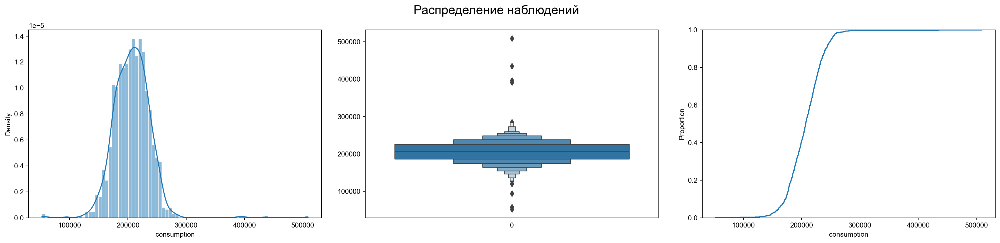

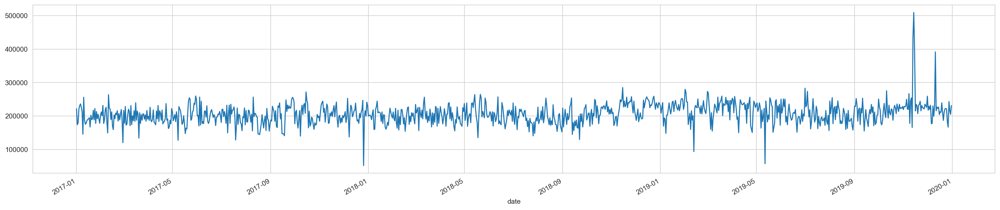

In [6]:
distribution(bada_entering_t1)

#### Бада - Ввод Т2 27.5 кВ

Описательные статистики:
count      1093.00
mean     219962.80
std       29831.53
min       62513.00
25%      201558.00
50%      222555.00
75%      240072.00
max      376978.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.24
____________________________________________________________________________________________________

Эксцесс:
1.59
____________________________________________________________________________________________________



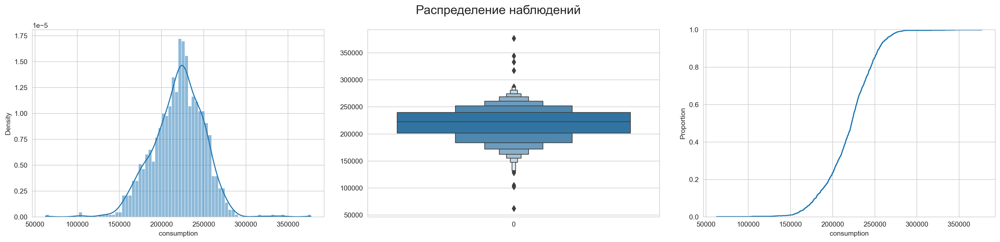

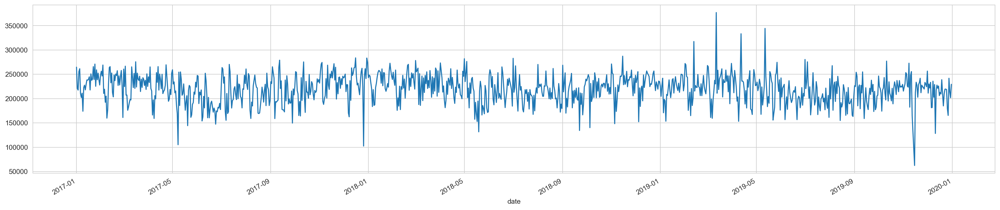

In [7]:
distribution(bada_entering_t2)

#### Белогорск - Ввод Т1 27.5 кВ

Описательные статистики:
count      1095.00
mean     167989.90
std       44842.86
min       52748.00
25%      132686.50
50%      167219.00
75%      203459.00
max      294960.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.03
____________________________________________________________________________________________________

Эксцесс:
-0.61
____________________________________________________________________________________________________



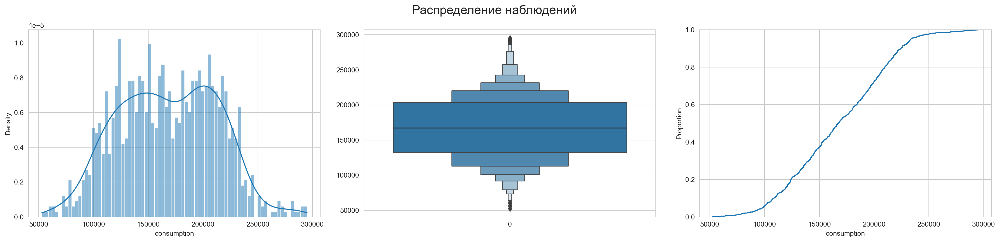

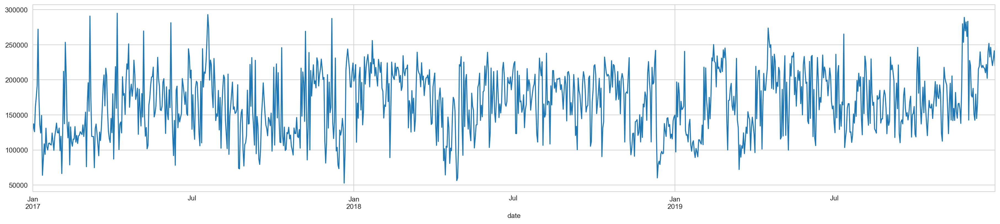

In [8]:
distribution(belogorsk_entering_t1)

#### Белогорск - Ввод Т2 27.5 кВ

Описательные статистики:
count      1069.00
mean     177526.91
std       45337.39
min           0.00
25%      140126.00
50%      174004.00
75%      217451.00
max      287722.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.08
____________________________________________________________________________________________________

Эксцесс:
-0.81
____________________________________________________________________________________________________



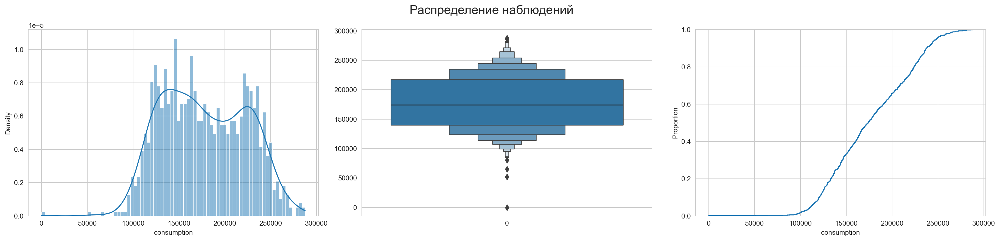

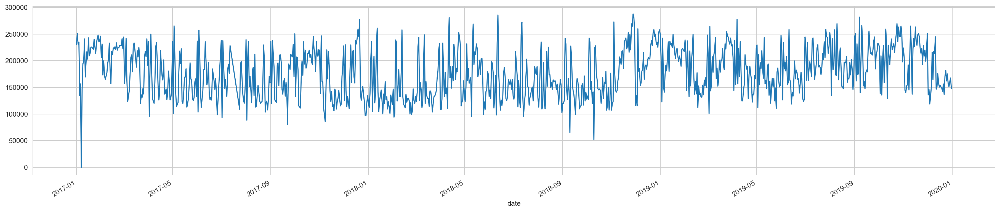

In [9]:
distribution(belogorsk_entering_t2)

#### Бушулей - Ввод Т1 27.5 кВ

Описательные статистики:
count      1094.00
mean     197100.34
std       26329.86
min        3517.00
25%      182439.25
50%      198774.00
75%      214219.00
max      341891.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.68
____________________________________________________________________________________________________

Эксцесс:
4.71
____________________________________________________________________________________________________



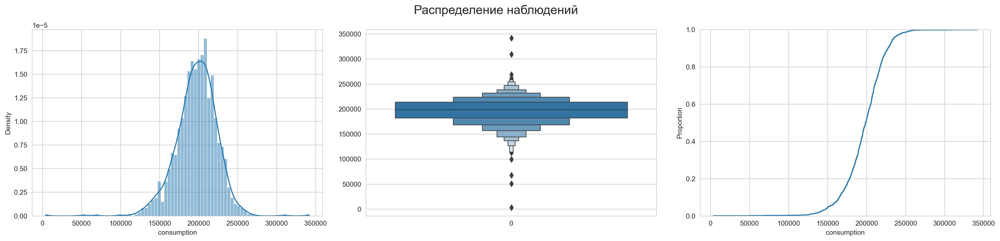

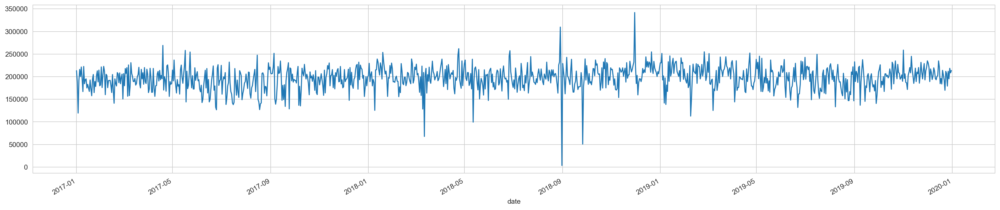

In [10]:
distribution(bushuley_entering_t1)

#### Бушулей - Ввод Т2 27.5 кВ

Описательные статистики:
count      1093.00
mean     196220.74
std       25515.21
min       50289.00
25%      181552.00
50%      197846.00
75%      213626.00
max      308569.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.58
____________________________________________________________________________________________________

Эксцесс:
2.05
____________________________________________________________________________________________________



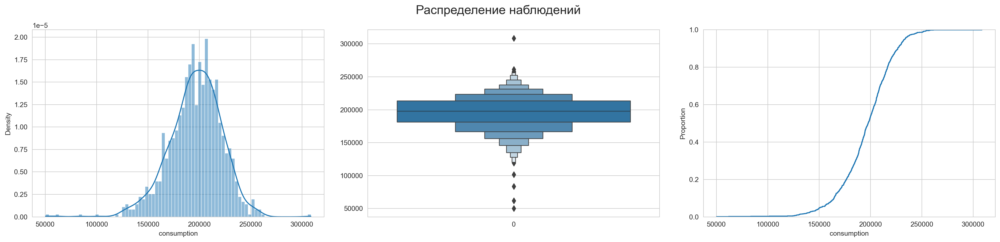

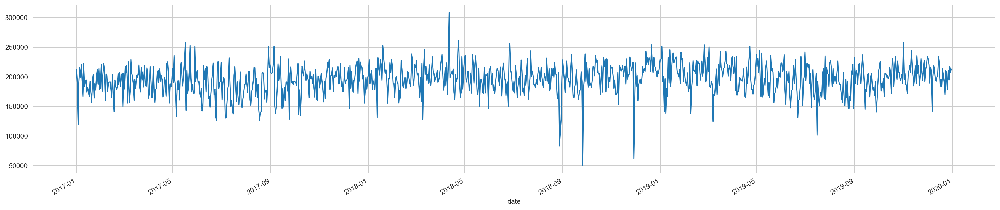

In [11]:
distribution(bushuley_entering_t2)

#### Завитая - Ввод Т1 27.5 кВ

Описательные статистики:
count      1094.00
mean     116673.61
std       26737.65
min       31254.00
25%      100638.75
50%      114506.00
75%      134508.25
max      208852.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.11
____________________________________________________________________________________________________

Эксцесс:
0.63
____________________________________________________________________________________________________



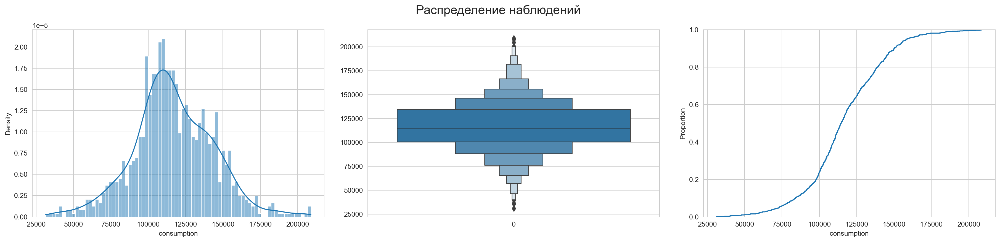

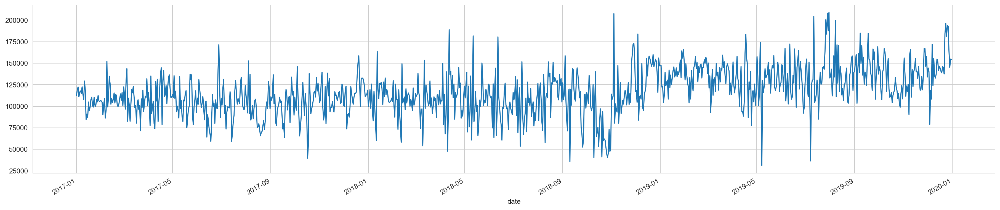

In [12]:
distribution(zavitaya_entering_t1)

#### Завитая - Ввод Т2 27.5 кВ

Описательные статистики:
count      1093.00
mean     122867.89
std       27907.53
min       25250.00
25%      107415.00
50%      124294.00
75%      139230.00
max      251056.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.13
____________________________________________________________________________________________________

Эксцесс:
1.45
____________________________________________________________________________________________________



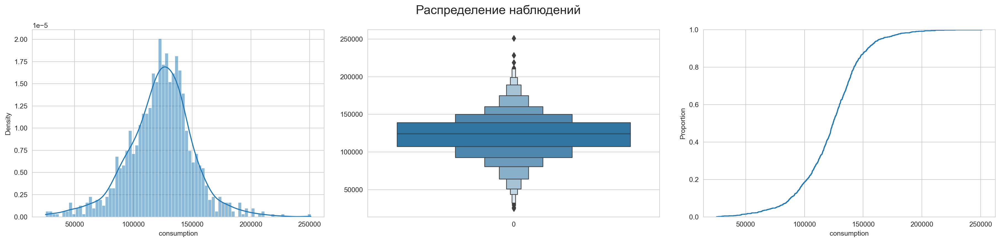

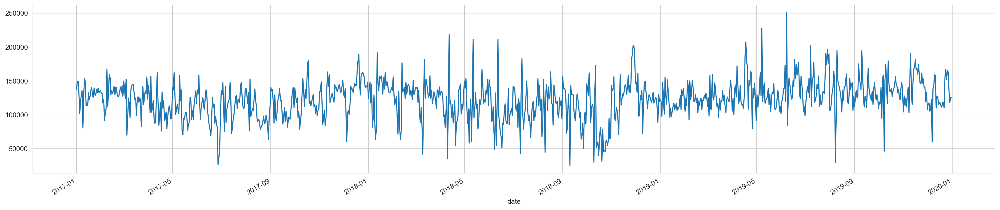

In [13]:
distribution(zavitaya_entering_t2)

#### Зилово - Ввод Т1 27.5 кВ

Описательные статистики:
count      1094.00
mean     119791.67
std       24977.48
min       49516.00
25%      104785.75
50%      118313.00
75%      134931.25
max      287493.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.55
____________________________________________________________________________________________________

Эксцесс:
3.4
____________________________________________________________________________________________________



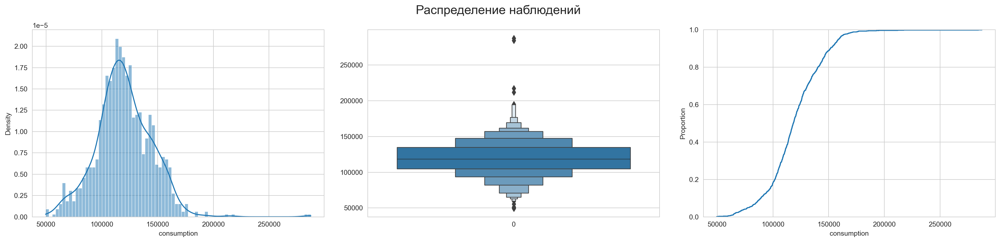

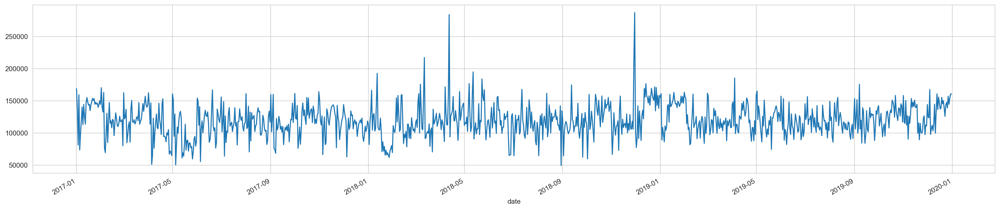

In [14]:
distribution(zilovo_entering_t1)

#### Зилово - Ввод Т3 27.5 кВ

Описательные статистики:
count      1091.00
mean     121278.19
std       22621.59
min       26362.00
25%      106929.50
50%      120670.00
75%      137082.00
max      195173.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.36
____________________________________________________________________________________________________

Эксцесс:
0.94
____________________________________________________________________________________________________



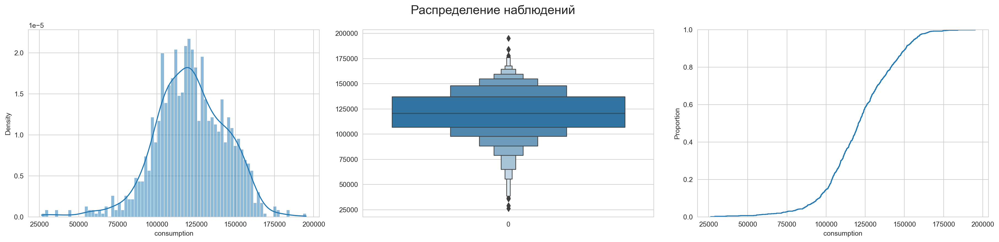

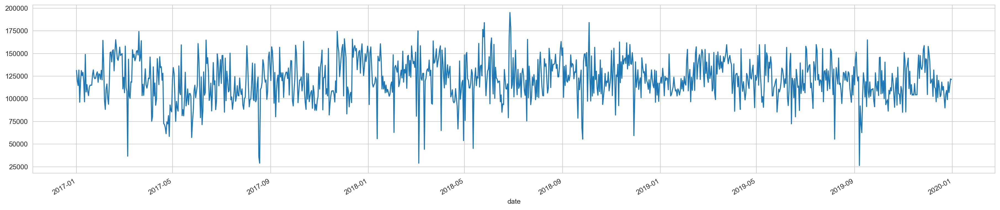

In [15]:
distribution(zilovo_entering_t3)

#### Карымская - Ввод Т6 27.5 кВ

Описательные статистики:
count      1093.00
mean     134408.57
std       62963.35
min           6.00
25%       93943.00
50%      111114.00
75%      143558.00
max      317190.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
1.15
____________________________________________________________________________________________________

Эксцесс:
0.23
____________________________________________________________________________________________________



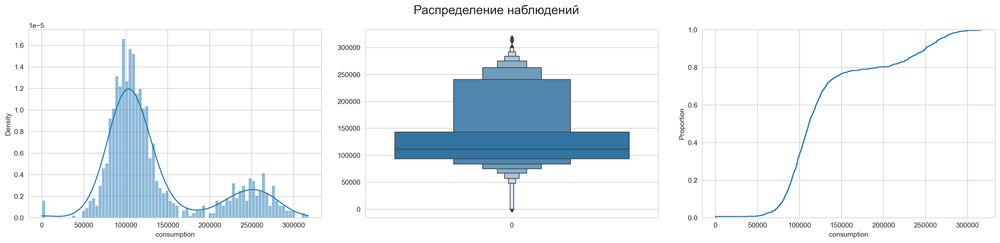

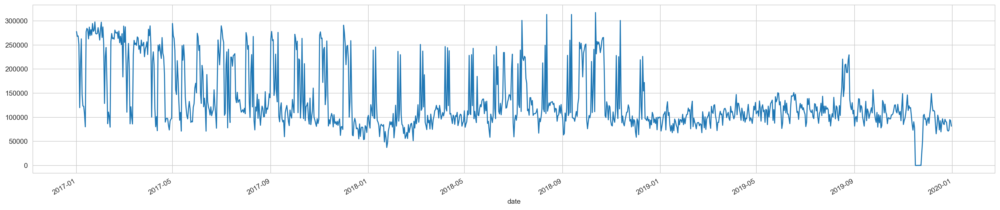

In [16]:
distribution(karymskaya_entering_t6)

#### Магдагачи - Ввод Т1 27.5 кВ

Описательные статистики:
count      1076.00
mean     122380.12
std       23607.76
min        4655.00
25%      110142.50
50%      121605.00
75%      132483.00
max      220781.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.1
____________________________________________________________________________________________________

Эксцесс:
4.52
____________________________________________________________________________________________________



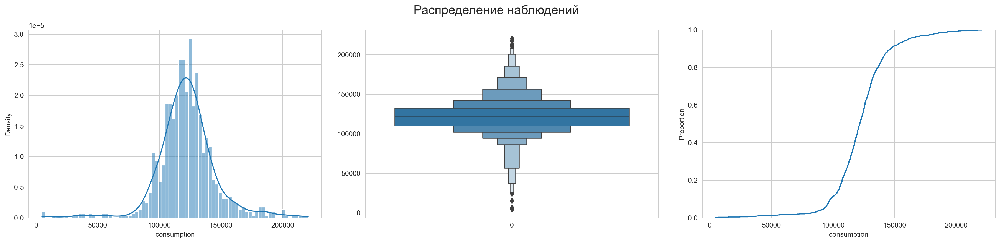

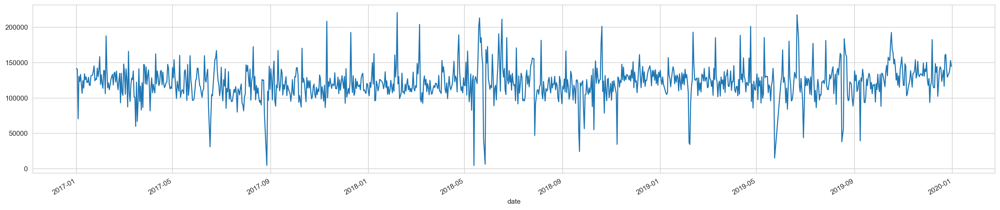

In [17]:
distribution(magdagachi_entering_t1)

#### Магдагачи - Ввод Т2 27.5 кВ

Описательные статистики:
count      1081.00
mean     118823.51
std       26922.67
min        2262.00
25%      106764.00
50%      119757.00
75%      131028.00
max      273306.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.22
____________________________________________________________________________________________________

Эксцесс:
4.2
____________________________________________________________________________________________________



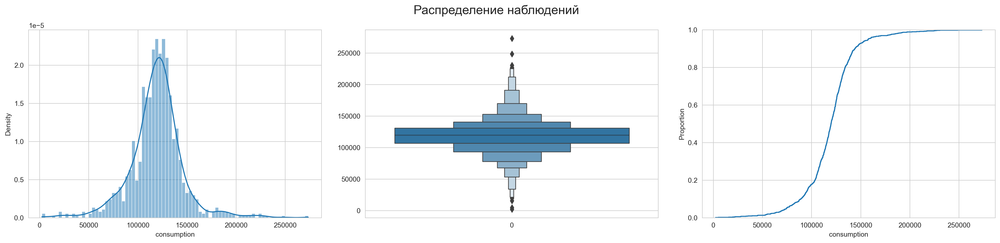

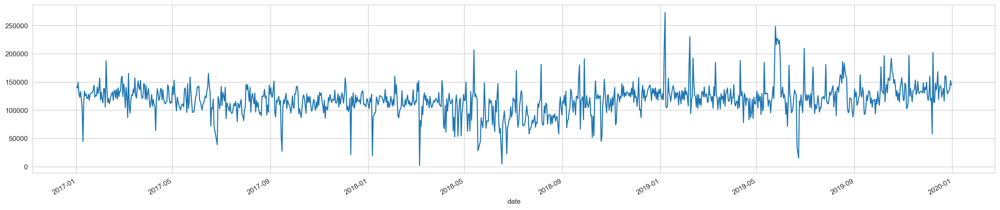

In [18]:
distribution(magdagachi_entering_t2)

#### Могзон - Ввод Т1 27.5 кВ

Описательные статистики:
count      1095.00
mean     155262.61
std       32716.00
min       50586.00
25%      134988.00
50%      153618.00
75%      172793.00
max      282059.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.26
____________________________________________________________________________________________________

Эксцесс:
0.5
____________________________________________________________________________________________________



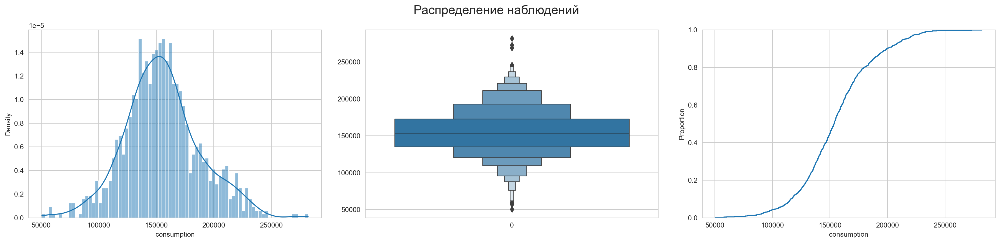

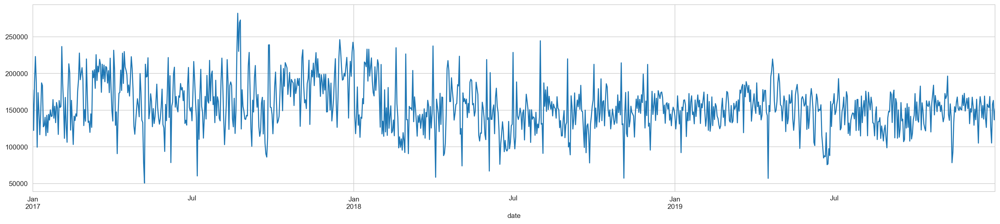

In [19]:
distribution(mogzon_entering_t1)

#### Могзон - Ввод Т2 27.5 кВ

Описательные статистики:
count      1091.00
mean     156507.79
std       29336.32
min       35357.00
25%      136976.00
50%      157880.00
75%      177716.00
max      227310.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.38
____________________________________________________________________________________________________

Эксцесс:
0.19
____________________________________________________________________________________________________



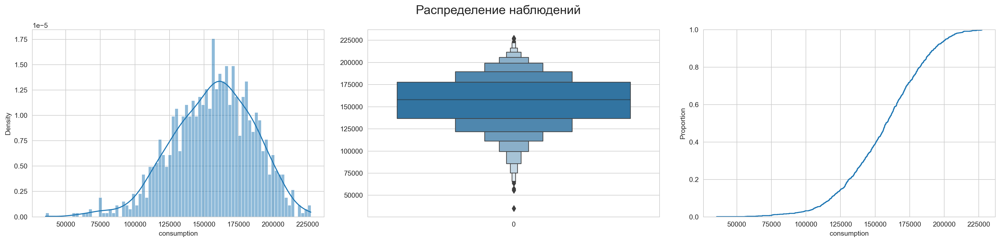

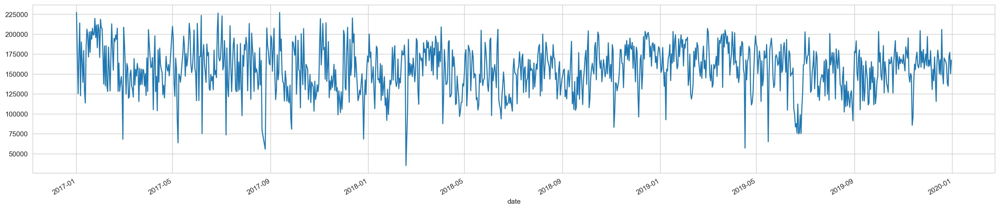

In [20]:
distribution(mogzon_entering_t2)

#### Новая - Ввод Т1 27.5 кВ

Описательные статистики:
count      1083.00
mean     228069.96
std       44547.62
min       54989.00
25%      195595.50
50%      230105.00
75%      260808.00
max      422325.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.05
____________________________________________________________________________________________________

Эксцесс:
0.97
____________________________________________________________________________________________________



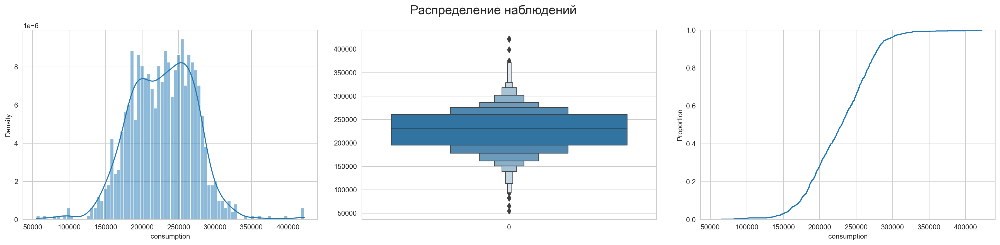

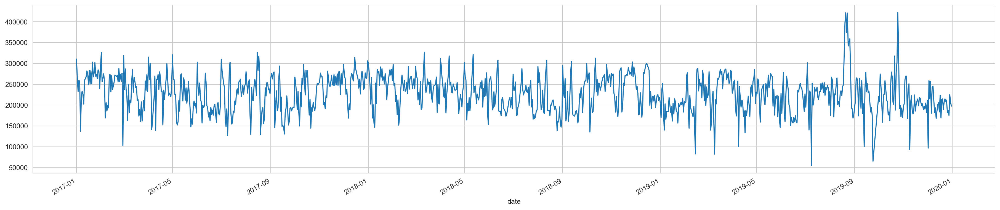

In [21]:
distribution(novaya_entering_t1)

#### Новая - Ввод Т2 27.5 кВ

Описательные статистики:
count      1085.00
mean     211094.78
std       43168.19
min       35009.00
25%      182758.00
50%      202242.00
75%      238049.00
max      371499.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.48
____________________________________________________________________________________________________

Эксцесс:
0.7
____________________________________________________________________________________________________



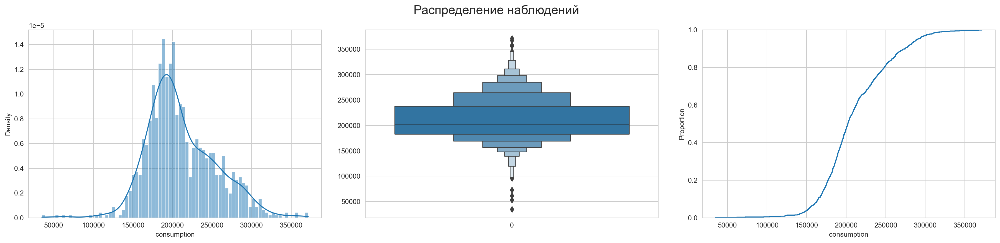

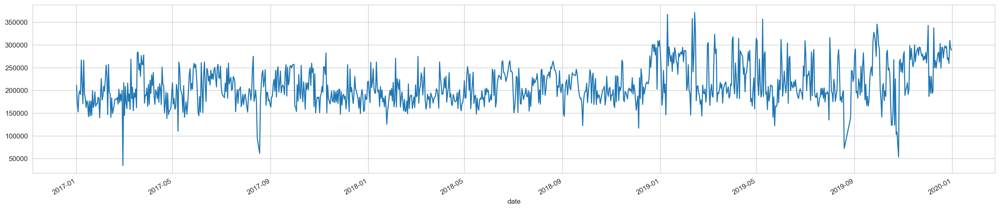

In [22]:
distribution(novaya_entering_t2)

### _Time Series Analysis_

---

### Trend analysis

In [23]:
def trend_analysis(substation):
    # ПОСТРОЕНИЕ СКОЛЬЗЯЩИХ СРЕДНИХ
    
    # 7-ми дневное скользящее среднее 
    data_7d_rol = substation.rolling(window = 7, center = True).mean()

    # 30-ми дневное скользящее среднее
    data_30d_rol = substation.rolling(window = 30, center = True).mean()

    # 365-ми дневное скользящее среднее
    data_365d_rol = substation.rolling(window = 365, center = True).mean()
    
    #ПОСТРОЕНИЕ ГРАФИКОВ СКОЛЬЗЯЩИХ СРЕДНИХ 
    
    fig, ax = plt.subplots(figsize = (20,5), dpi= 100)

    # plotting daily data
    ax.plot(substation, marker='*', markersize=2, color='0.6',linestyle='None', label='Daily')

    # Запасной вариант представления
    # ax.plot(novaya_entering_t2, linewidth=2, label='Daily', color='0.6', alpha = 0.5 )

    # plotting 7-day rolling data
    ax.plot(data_7d_rol, linewidth=2, label='7-d Rolling Mean')

    # plotting 30-day rolling data
    ax.plot(data_30d_rol, linewidth=2, label='30-d Rolling Mean')

    # plotting annual rolling data
    ax.plot(data_365d_rol, color='0.2', linewidth=3, label='Trend (365-d Rolling Mean)')

        
    # Beautification of plot
    # ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.legend()
    ax.set_xlabel('Year')
    ax.set_ylabel('Consumption')
    ax.set_title('Trends in Electricity Consumption')

#### Бада - Ввод Т1 27.5 кВ

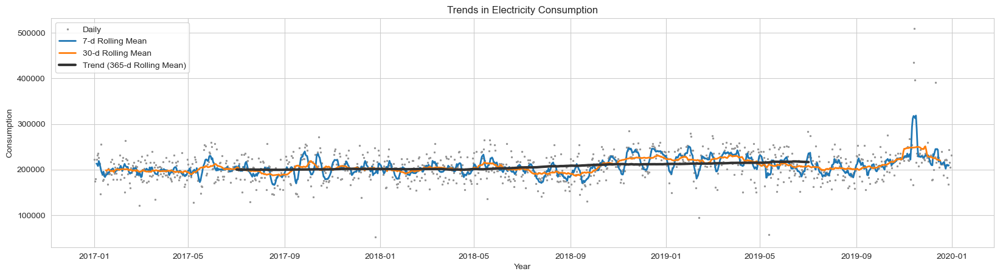

In [24]:
trend_analysis(bada_entering_t1)

#### Бада - Ввод Т2 27.5 кВ

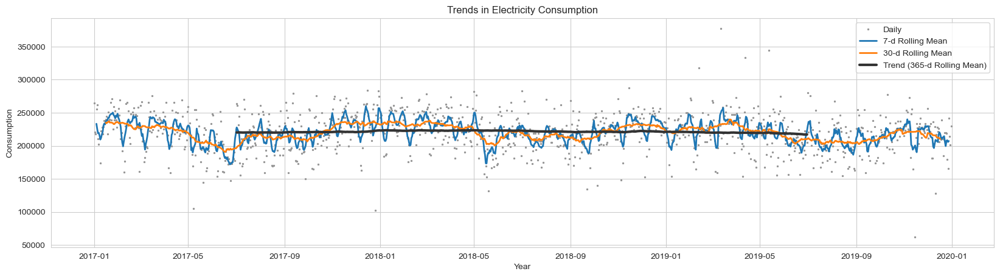

In [25]:
trend_analysis(bada_entering_t2)

#### Белогорск - Ввод Т1 27.5 кВ

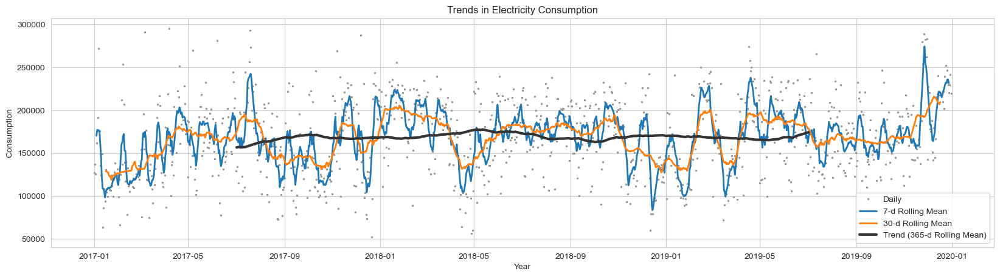

In [26]:
trend_analysis(belogorsk_entering_t1)

#### Белогорск - Ввод Т2 27.5 кВ

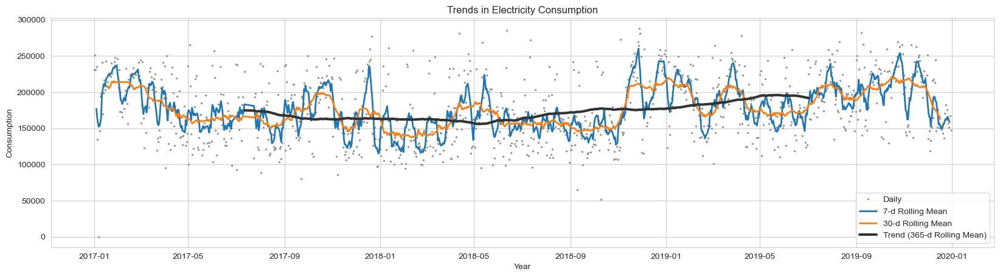

In [27]:
trend_analysis(belogorsk_entering_t2)

#### Бушулей - Ввод Т1 27.5 кВ

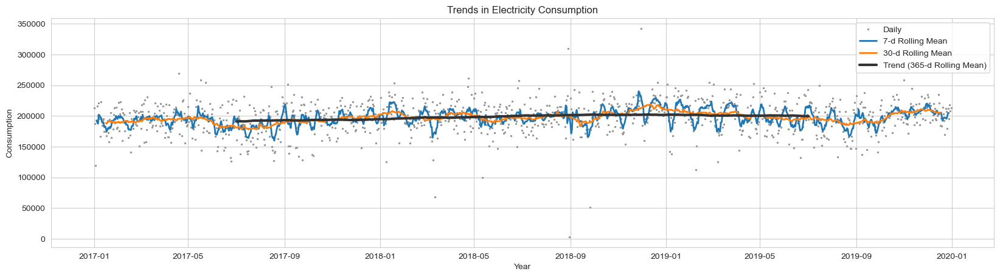

In [28]:
trend_analysis(bushuley_entering_t1)

#### Бушулей - Ввод Т2 27.5 кВ

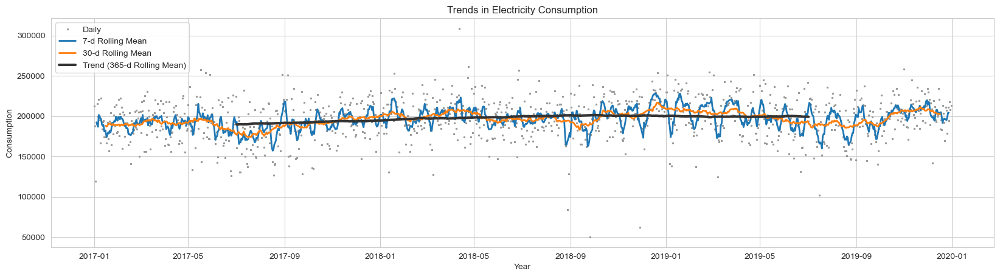

In [29]:
trend_analysis(bushuley_entering_t2)

#### Завитая - Ввод Т1 27.5 кВ

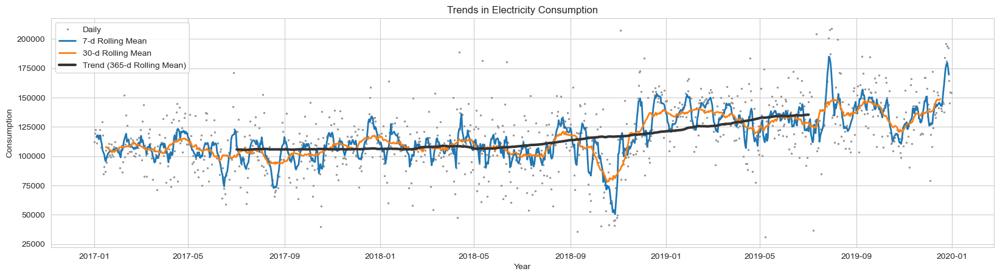

In [30]:
trend_analysis(zavitaya_entering_t1)

#### Завитая - Ввод Т2 27.5 кВ

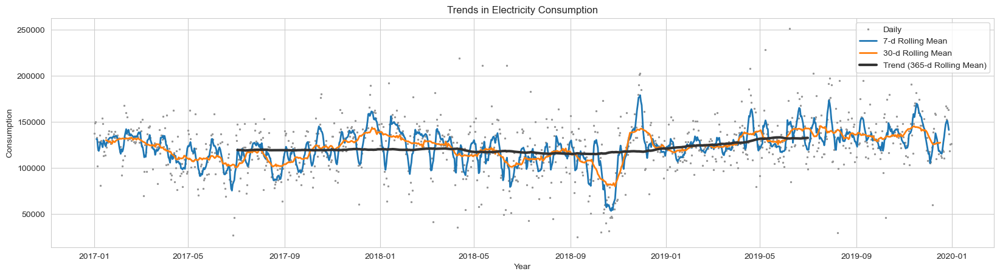

In [31]:
trend_analysis(zavitaya_entering_t2)

#### Зилово - Ввод Т1 27.5 кВ

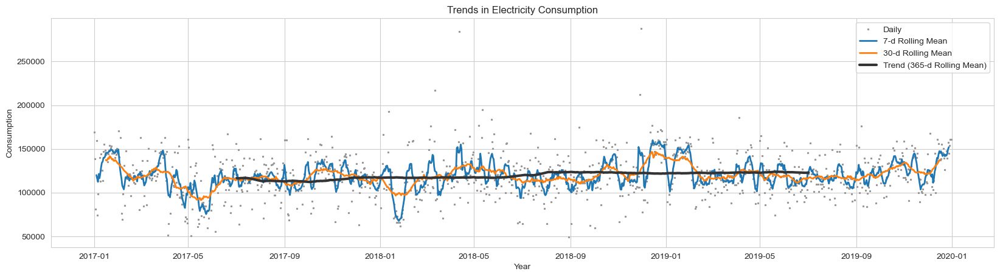

In [32]:
trend_analysis(zilovo_entering_t1)

#### Зилово - Ввод Т3 27.5 кВ

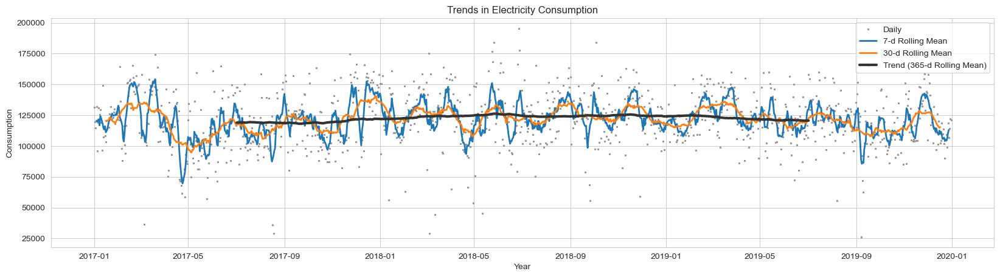

In [33]:
trend_analysis(zilovo_entering_t3)

#### Карымская - Ввод Т6 27.5 кВ

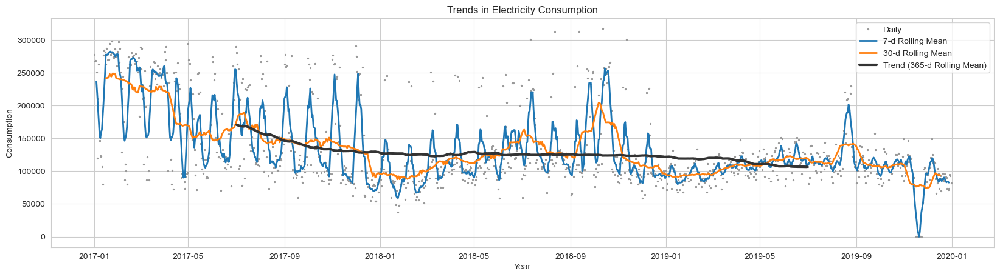

In [34]:
trend_analysis(karymskaya_entering_t6)

#### Магдагачи - Ввод Т1 27.5 кВ

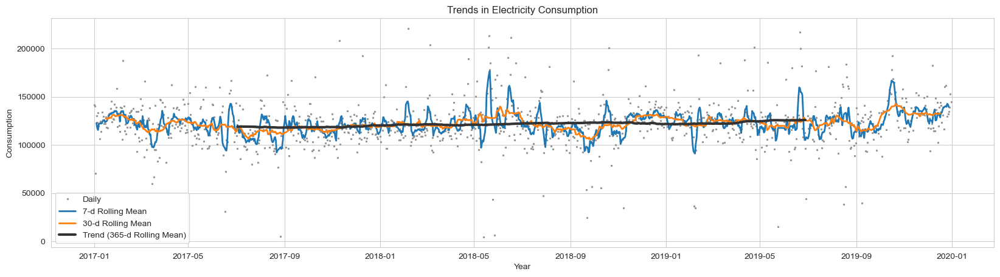

In [35]:
trend_analysis(magdagachi_entering_t1)

#### Магдагачи - Ввод Т2 27.5 кВ

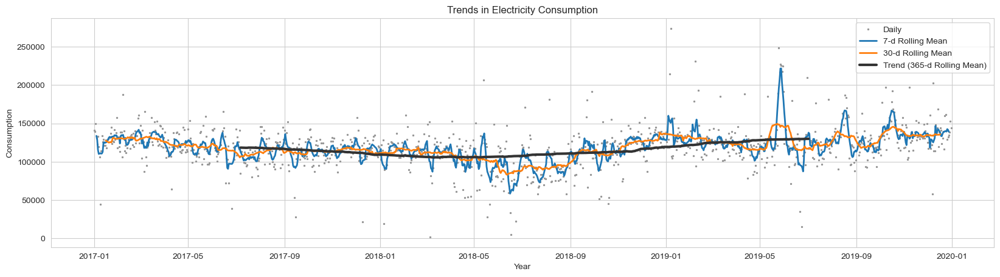

In [36]:
trend_analysis(magdagachi_entering_t2)

#### Могзон - Ввод Т1 27.5 кВ

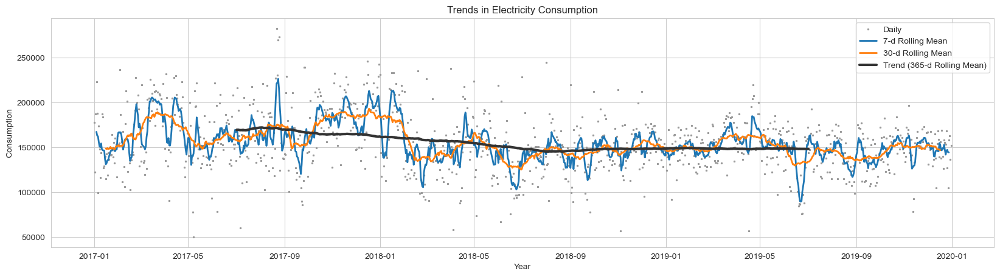

In [37]:
trend_analysis(mogzon_entering_t1)

#### Могзон - Ввод Т2 27.5 кВ

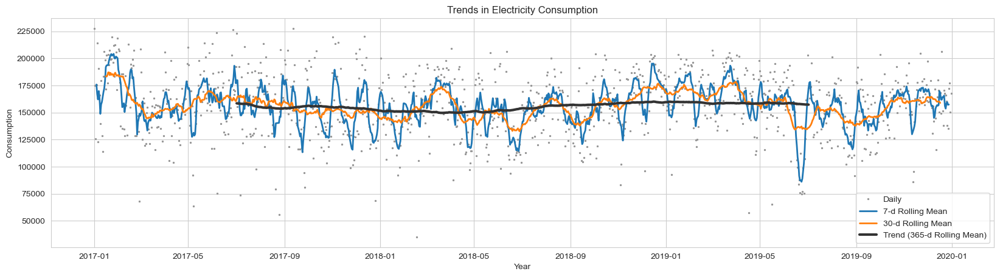

In [38]:
trend_analysis(mogzon_entering_t2)

#### Новая - Ввод Т1 27.5 кВ

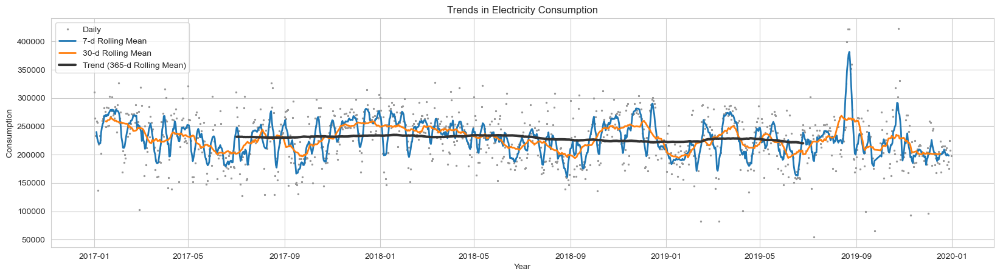

In [39]:
trend_analysis(novaya_entering_t1)

#### Новая - Ввод Т2 27.5 кВ

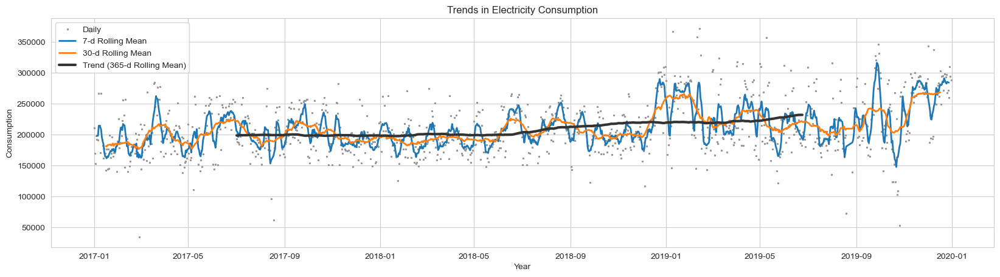

In [40]:
trend_analysis(novaya_entering_t2)

### Autocorrelation analysis

In [41]:
def autocorr_analysis(substation):
    from pandas.plotting import autocorrelation_plot
    
    fig, ax = plt.subplots(1, 2, figsize=(20, 3), dpi= 100)
    plt.suptitle("Autocorrelation", fontsize=18)
    
    sm.graphics.tsa.plot_acf(substation.values.squeeze(), lags=50, ax=ax[0])
    sm.graphics.tsa.plot_pacf(substation.values.squeeze(), lags=50, ax=ax[1])
    plt.show()

    fig, ax = plt.subplots(figsize=(19.7, 3), dpi= 100)
    pd.plotting.autocorrelation_plot(substation, ax=ax)
    plt.show()

#### Бада - Ввод Т1 27.5 кВ

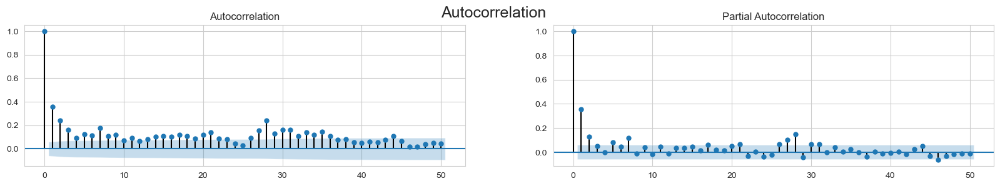

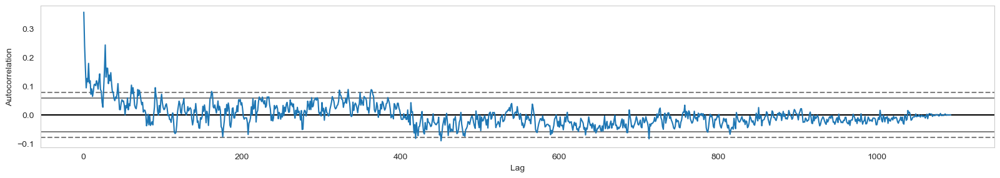

In [42]:
autocorr_analysis(bada_entering_t1)

#### Бада - Ввод Т2 27.5 кВ

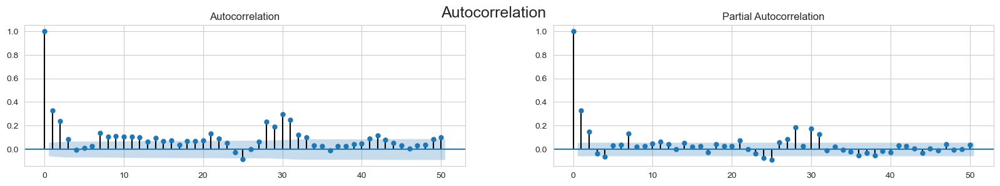

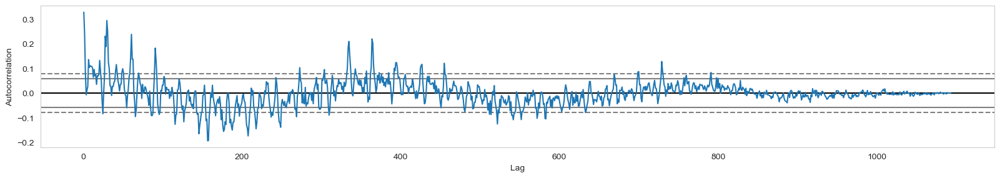

In [43]:
autocorr_analysis(bada_entering_t2)

#### Белогорск - Ввод Т1 27.5 кВ

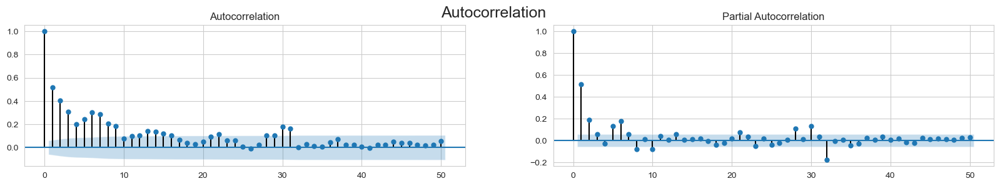

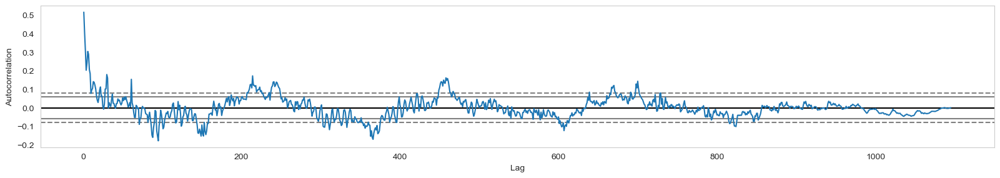

In [44]:
autocorr_analysis(belogorsk_entering_t1)

#### Белогорск - Ввод Т2 27.5 кВ

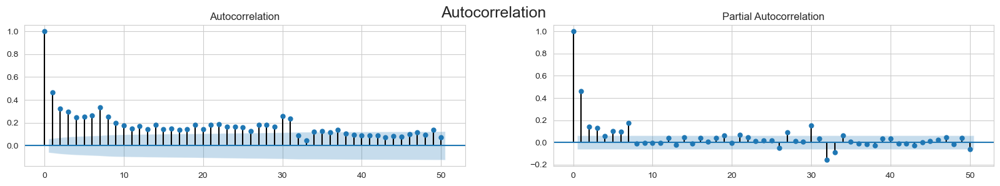

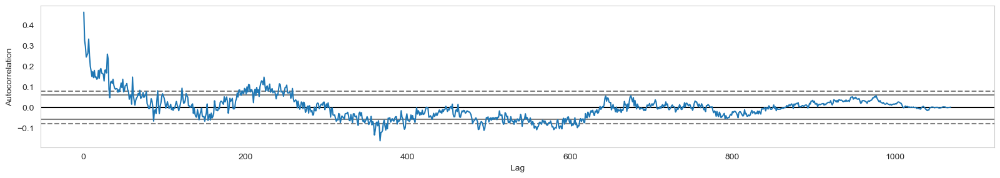

In [45]:
autocorr_analysis(belogorsk_entering_t2)

#### Бушулей - Ввод Т1 27.5 кВ

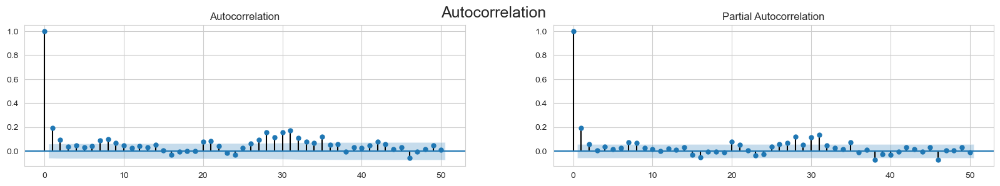

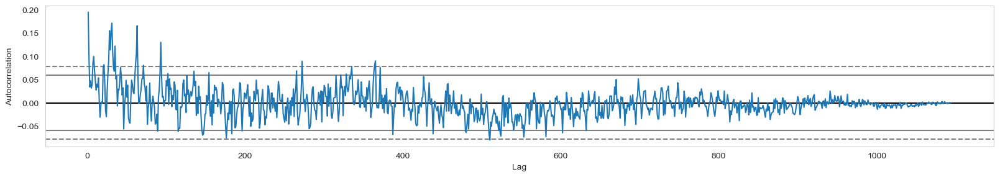

In [46]:
autocorr_analysis(bushuley_entering_t1)

#### Бушулей - Ввод Т2 27.5 кВ

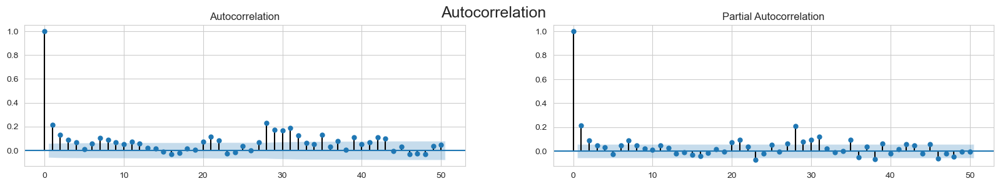

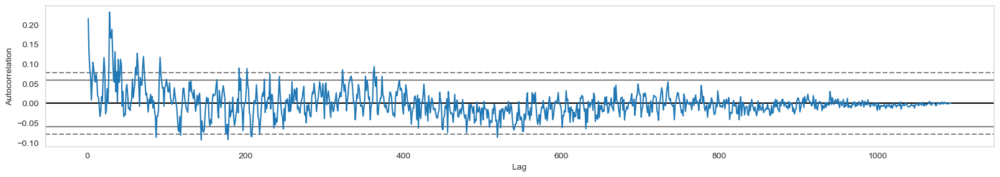

In [47]:
autocorr_analysis(bushuley_entering_t2)

#### Завитая - Ввод Т1 27.5 кВ

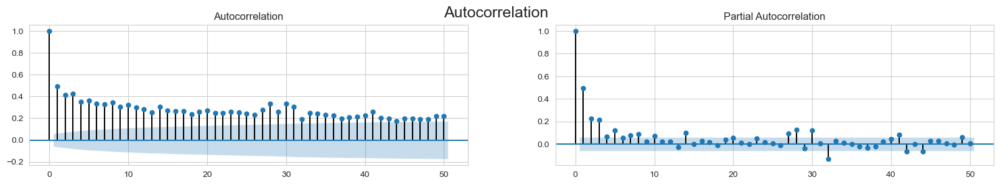

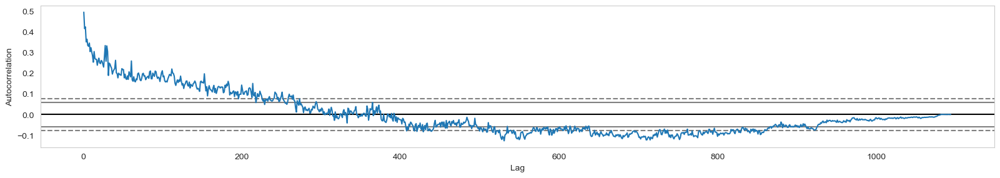

In [48]:
autocorr_analysis(zavitaya_entering_t1)

#### Завитая - Ввод Т2 27.5 кВ

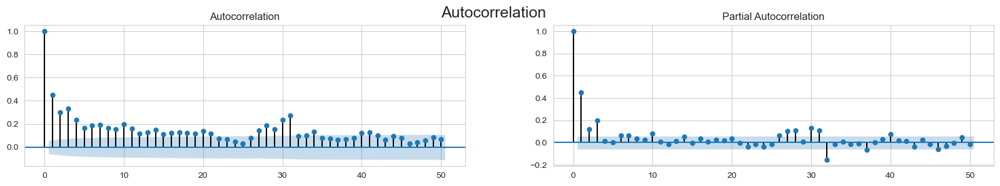

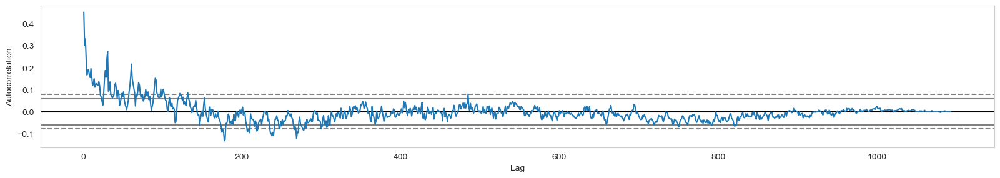

In [49]:
autocorr_analysis(zavitaya_entering_t2)

#### Зилово - Ввод Т1 27.5 кВ

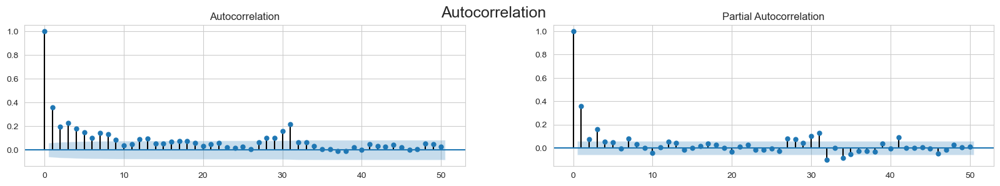

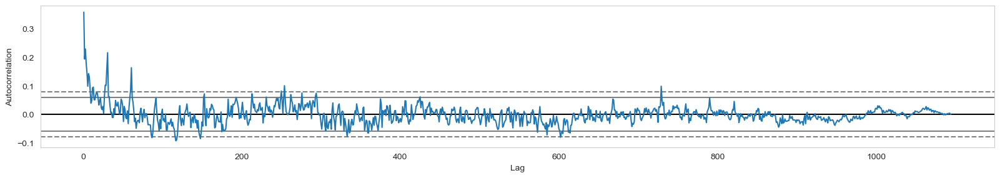

In [50]:
autocorr_analysis(zilovo_entering_t1)

#### Зилово - Ввод Т3 27.5 кВ

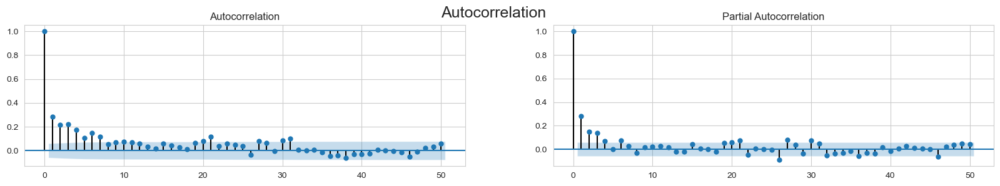

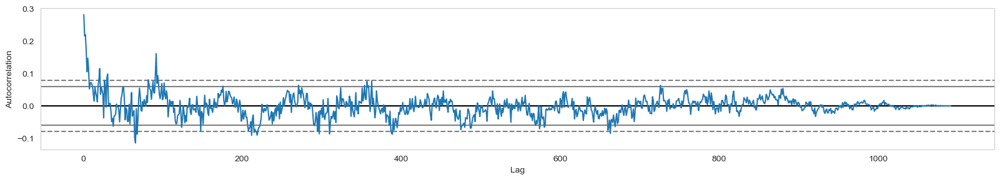

In [51]:
autocorr_analysis(zilovo_entering_t3)

#### Карымская - Ввод Т6 27.5 кВ

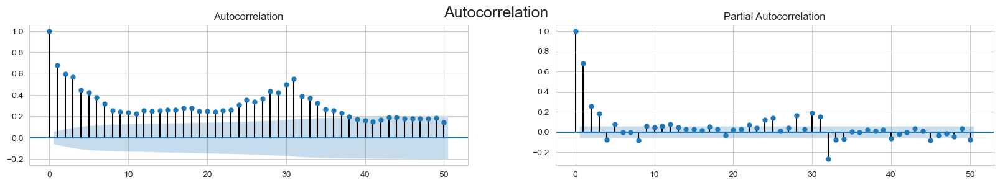

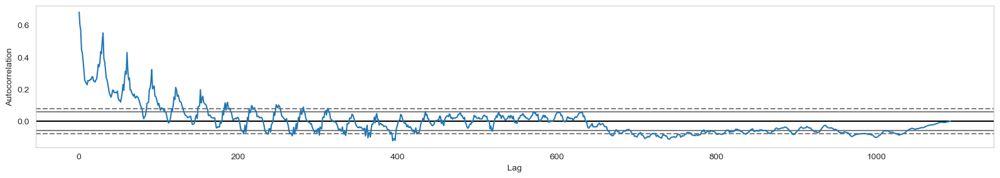

In [52]:
autocorr_analysis(karymskaya_entering_t6)

#### Магдагачи - Ввод Т1 27.5 кВ

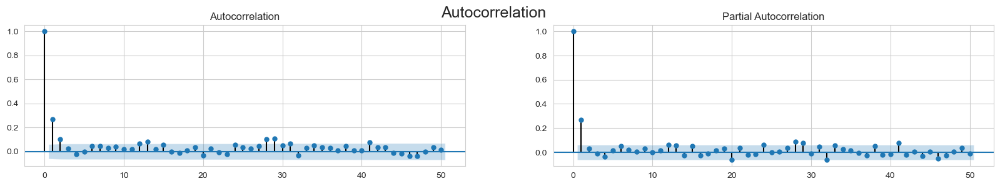

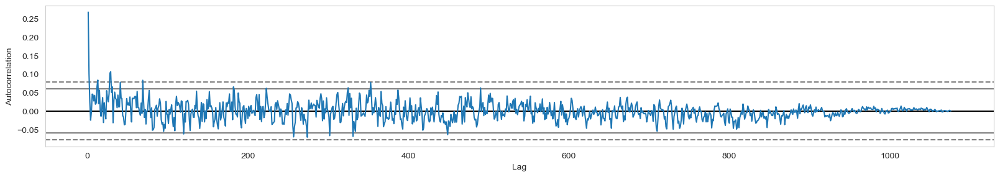

In [53]:
autocorr_analysis(magdagachi_entering_t1)

#### Магдагачи - Ввод Т2 27.5 кВ

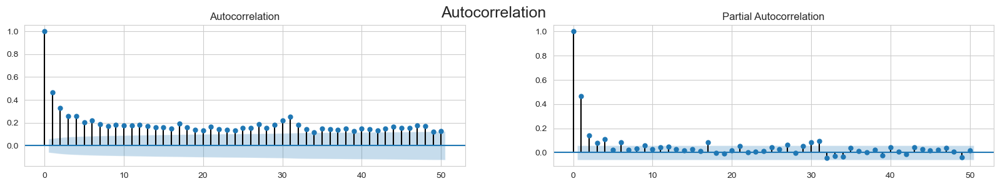

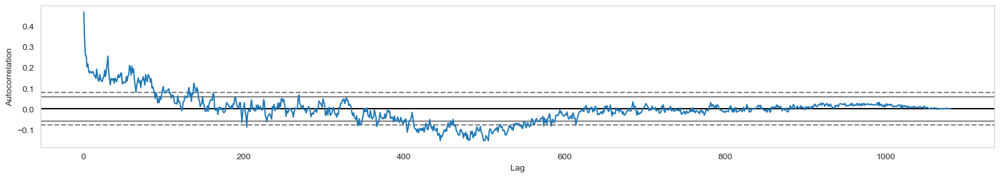

In [54]:
autocorr_analysis(magdagachi_entering_t2)

#### Могзон - Ввод Т1 27.5 кВ

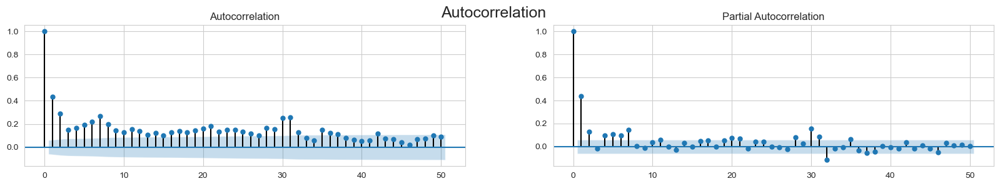

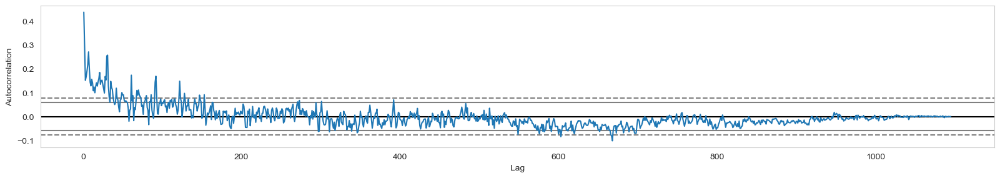

In [55]:
autocorr_analysis(mogzon_entering_t1)

#### Могзон - Ввод Т2 27.5 кВ

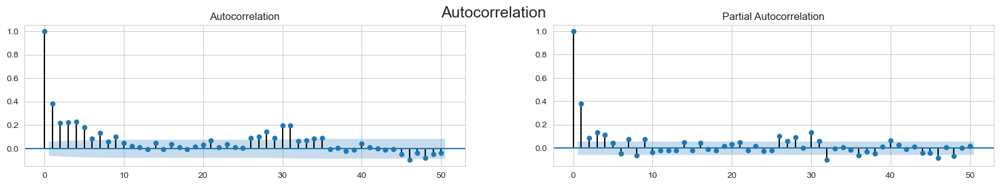

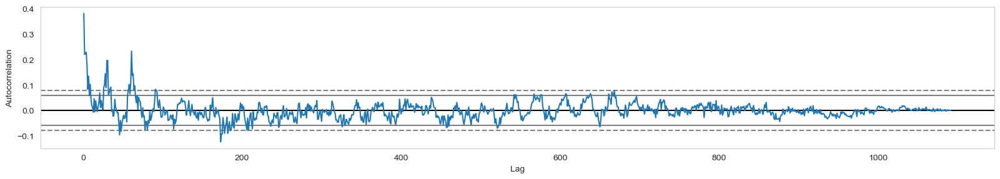

In [56]:
autocorr_analysis(mogzon_entering_t2)

#### Новая - Ввод Т1 27.5 кВ

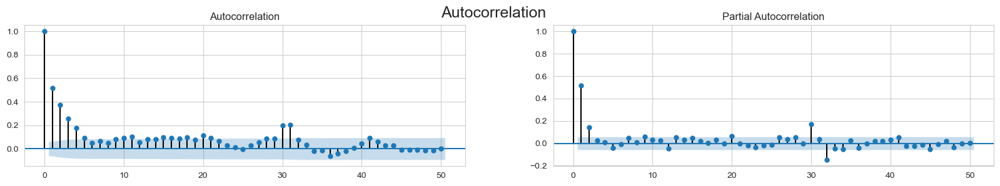

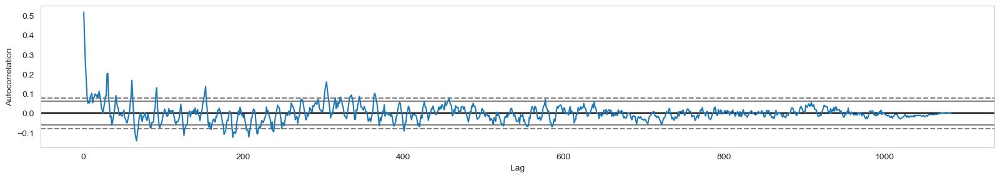

In [57]:
autocorr_analysis(novaya_entering_t1)

#### Новая - Ввод Т2 27.5 кВ

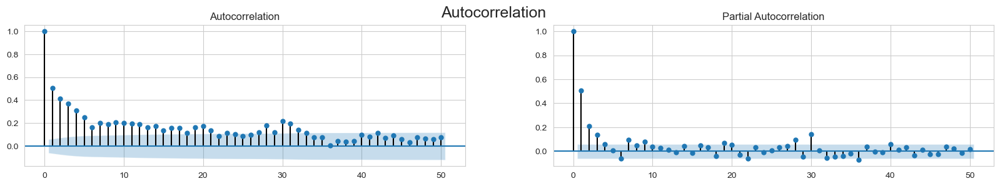

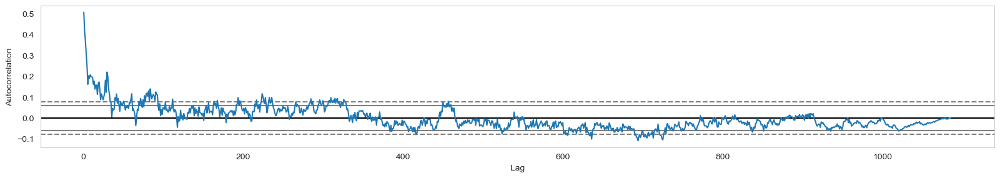

In [58]:
autocorr_analysis(novaya_entering_t2)

### Analysis of seasonality

In [59]:
def seasonality_analysis(substation, period=120):
    seasonality = sm.tsa.seasonal_decompose(substation, model='additive', period=period).seasonal
    fig, ax = plt.subplots(figsize = (20,5), dpi= 100)
    ax.plot(seasonality)                 

#### Бада - Ввод Т1 27.5 кВ

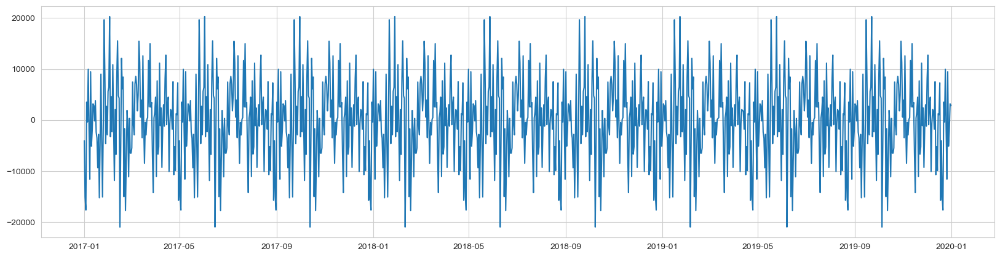

In [60]:
seasonality_analysis(bada_entering_t1)

#### Бада - Ввод Т2 27.5 кВ

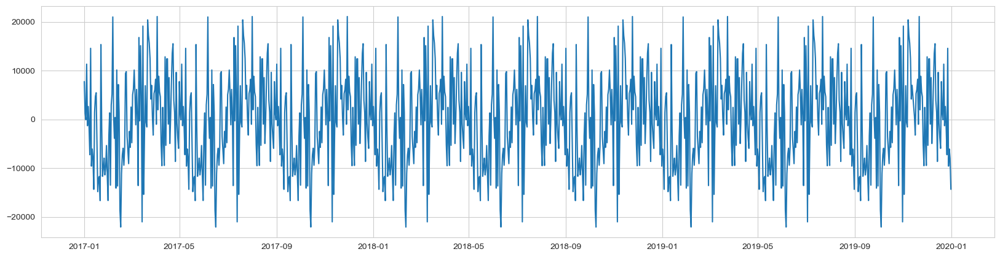

In [61]:
seasonality_analysis(bada_entering_t2)

#### Белогорск - Ввод Т1 27.5 кВ

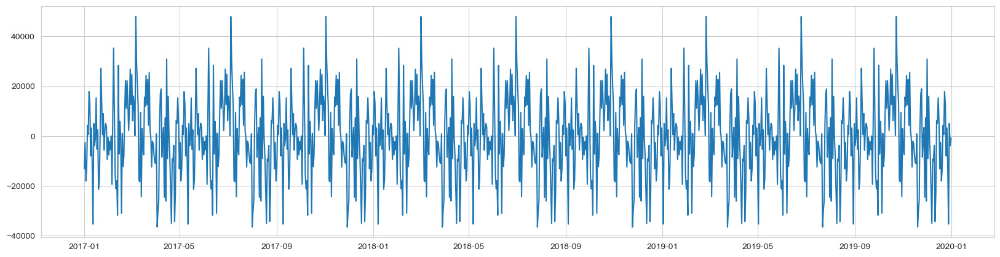

In [62]:
seasonality_analysis(belogorsk_entering_t1)

#### Белогорск - Ввод Т2 27.5 кВ

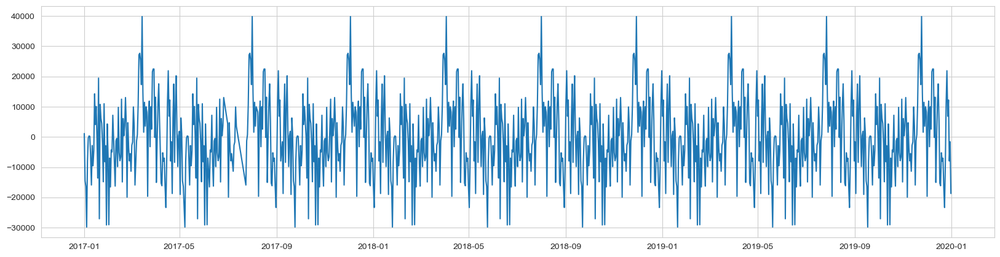

In [63]:
seasonality_analysis(belogorsk_entering_t2)

#### Бушулей - Ввод Т1 27.5 кВ

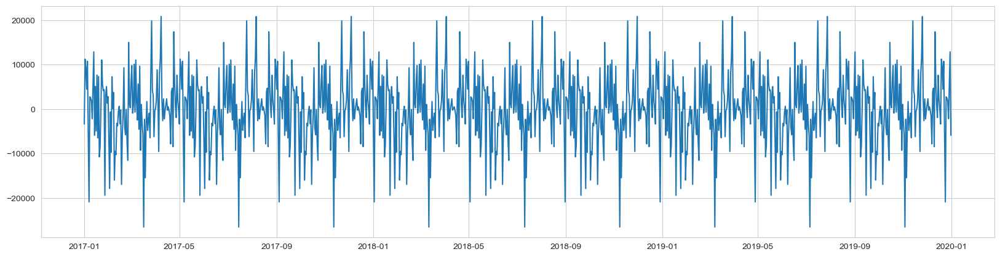

In [64]:
seasonality_analysis(bushuley_entering_t1)

#### Бушулей - Ввод Т2 27.5 кВ

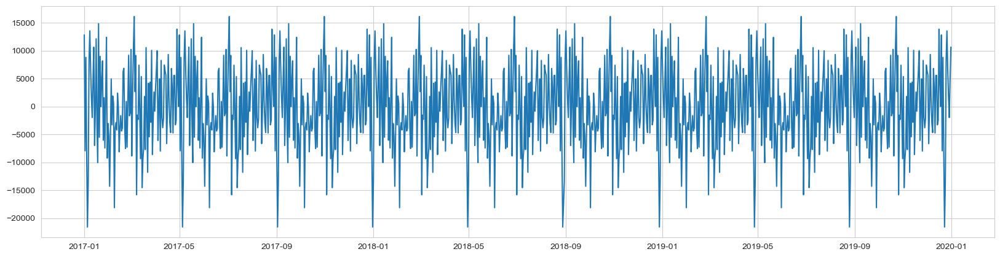

In [65]:
seasonality_analysis(bushuley_entering_t2)

#### Завитая - Ввод Т1 27.5 кВ

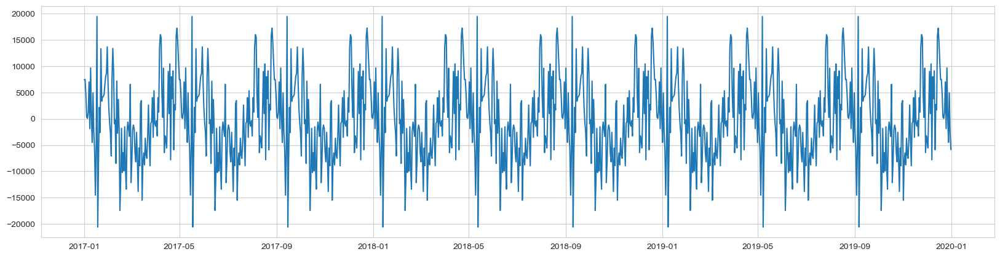

In [66]:
seasonality_analysis(zavitaya_entering_t1)

#### Завитая - Ввод Т2 27.5 кВ

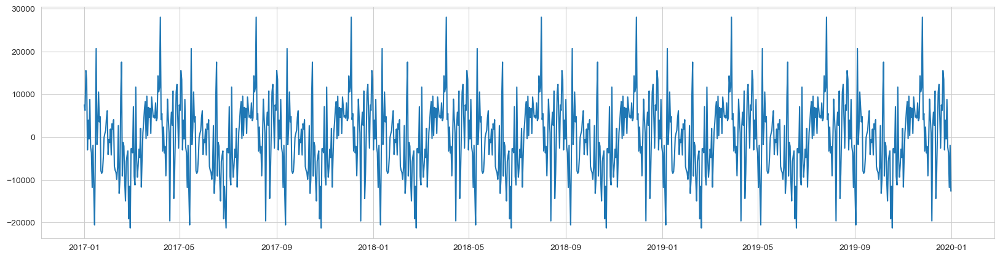

In [67]:
seasonality_analysis(zavitaya_entering_t2)

#### Зилово - Ввод Т1 27.5 кВ

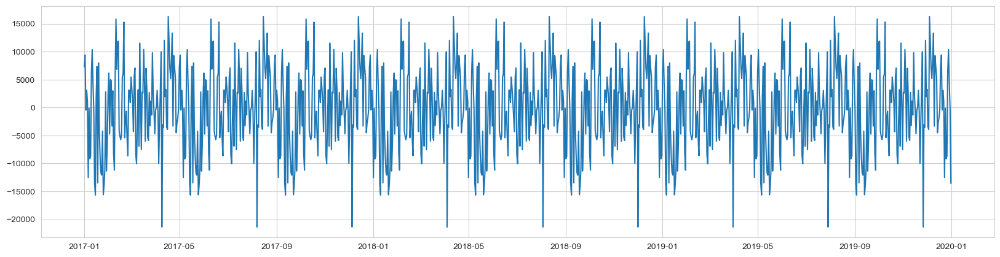

In [68]:
seasonality_analysis(zilovo_entering_t1)

#### Зилово - Ввод Т3 27.5 кВ

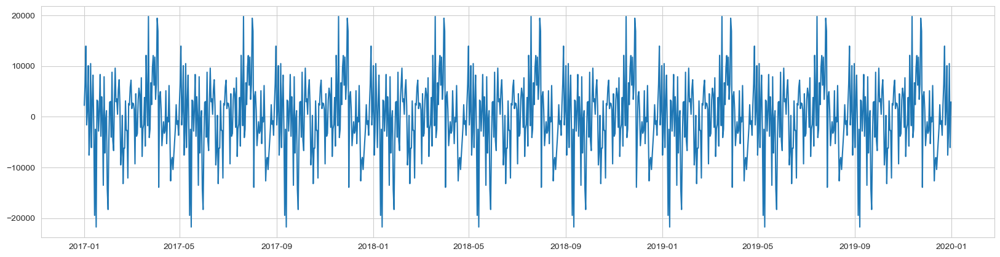

In [69]:
seasonality_analysis(zilovo_entering_t3)

#### Карымская - Ввод Т6 27.5 кВ

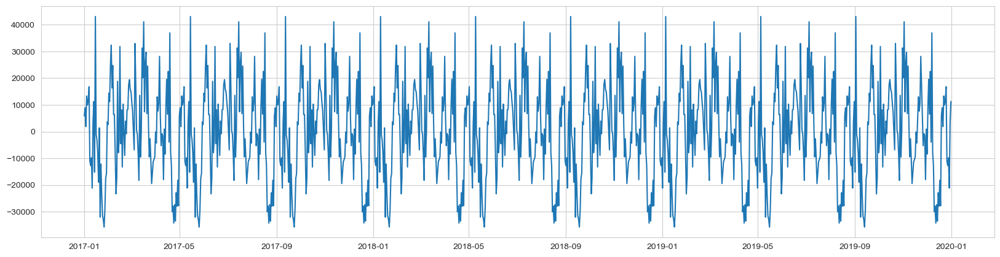

In [70]:
seasonality_analysis(karymskaya_entering_t6)

#### Магдагачи - Ввод Т1 27.5 кВ

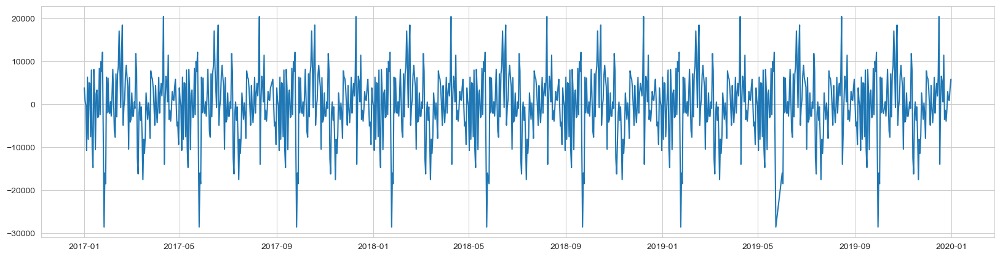

In [71]:
seasonality_analysis(magdagachi_entering_t1)

#### Магдагачи - Ввод Т2 27.5 кВ

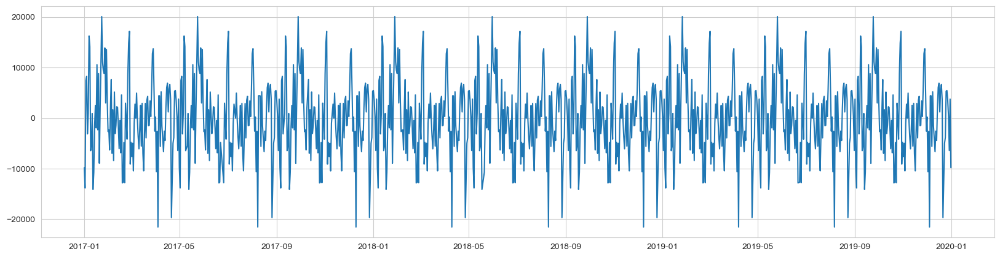

In [72]:
seasonality_analysis(magdagachi_entering_t2)

#### Могзон - Ввод Т1 27.5 кВ

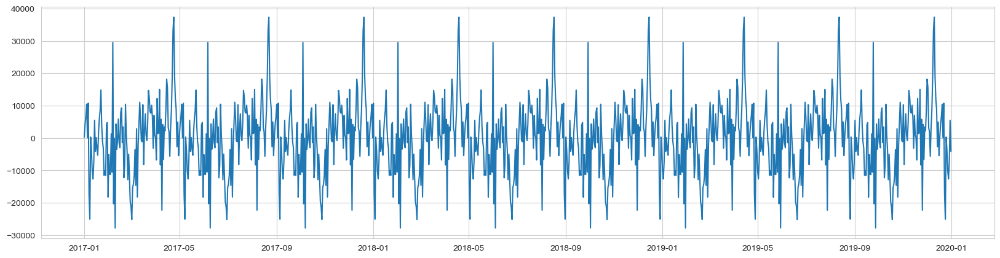

In [73]:
seasonality_analysis(mogzon_entering_t1)

#### Могзон - Ввод Т2 27.5 кВ

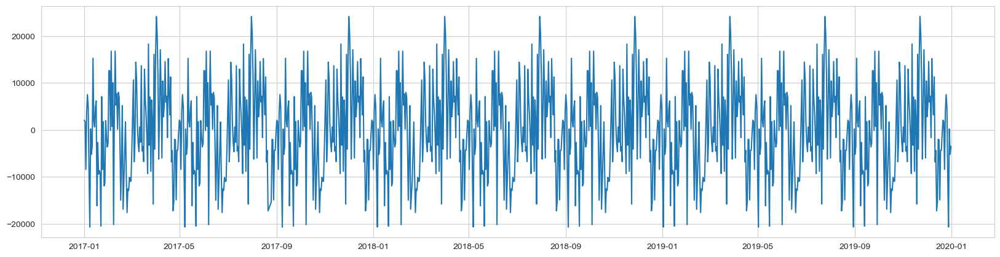

In [74]:
seasonality_analysis(mogzon_entering_t2)

#### Новая - Ввод Т1 27.5 кВ

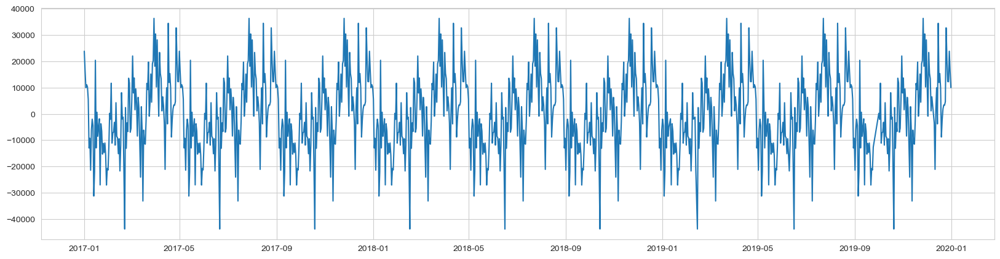

In [75]:
seasonality_analysis(novaya_entering_t1)

#### Новая - Ввод Т2 27.5 кВ

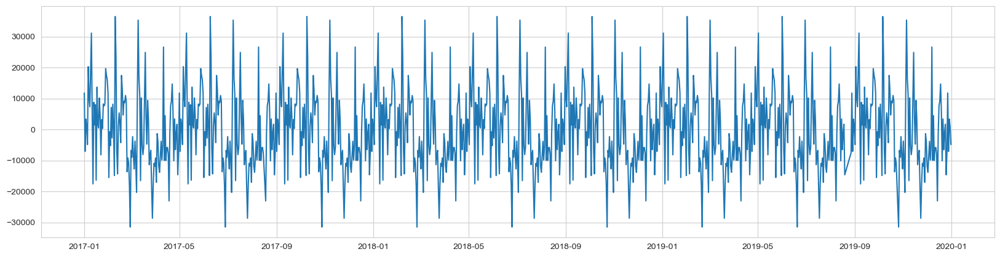

In [76]:
seasonality_analysis(novaya_entering_t2)

### Analysis of stationarity

In [90]:
def stationarity_analysis(substation):
    test = sm.tsa.adfuller(substation)
    print ('adf:', test[0])
    print ('p-value:', test[1])
    print ('Critical values:', test[4])
    if test[0]> test[4]['5%']: 
        print ('\n Eсть единичные корни, ряд не стационарен')
    else:
        print ('\n Eдиничных корней нет, ряд СТАЦИОНАРЕН')

#### Бада - Ввод Т1 27.5 кВ

In [91]:
stationarity_analysis(bada_entering_t1)

adf: -8.50917994980306
p-value: 1.1801541777468733e-13
Critical values: {'1%': -3.4363857496063455, '5%': -2.8642050392821794, '10%': -2.5681889563132314}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Бада - Ввод Т2 27.5 кВ

In [92]:
stationarity_analysis(bada_entering_t2)

adf: -7.069448636118101
p-value: 4.981070694091727e-10
Critical values: {'1%': -3.4364081161854747, '5%': -2.8642149051061954, '10%': -2.5681942108302214}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Белогорск - Ввод Т1 27.5 кВ

In [93]:
stationarity_analysis(belogorsk_entering_t1)

adf: -7.263154059355735
p-value: 1.6611732513173946e-10
Critical values: {'1%': -3.436391325753478, '5%': -2.864207498909067, '10%': -2.5681902663042324}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Белогорск - Ввод Т2 27.5 кВ

In [94]:
stationarity_analysis(belogorsk_entering_t2)

adf: -6.326370874290225
p-value: 2.9795063308688502e-08
Critical values: {'1%': -3.4365224825380714, '5%': -2.86426535058257, '10%': -2.568221078163292}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Бушулей - Ввод Т1 27.5 кВ

In [95]:
stationarity_analysis(bushuley_entering_t1)

adf: -9.137613291694734
p-value: 2.9069562124731958e-15
Critical values: {'1%': -3.4363857496063455, '5%': -2.8642050392821794, '10%': -2.5681889563132314}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Бушулей - Ввод Т2 27.5 кВ

In [96]:
stationarity_analysis(bushuley_entering_t2)

adf: -9.887640123103393
p-value: 3.62814886086091e-17
Critical values: {'1%': -3.4363857496063455, '5%': -2.8642050392821794, '10%': -2.5681889563132314}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Завитая - Ввод Т1 27.5 кВ

In [97]:
stationarity_analysis(zavitaya_entering_t1)

adf: -3.691567479936268
p-value: 0.0042333407108909584
Critical values: {'1%': -3.436419361753321, '5%': -2.864219865461312, '10%': -2.5681968527091907}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Завитая - Ввод Т2 27.5 кВ

In [98]:
stationarity_analysis(zavitaya_entering_t2)

adf: -6.477123981740981
p-value: 1.322641112890993e-08
Critical values: {'1%': -3.436402509014354, '5%': -2.8642124318084456, '10%': -2.568192893555997}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Зилово - Ввод Т1 27.5 кВ

In [99]:
stationarity_analysis(zilovo_entering_t1)

adf: -8.56679454484128
p-value: 8.404124932722037e-14
Critical values: {'1%': -3.436380183743342, '5%': -2.8642025841870655, '10%': -2.568187648736553}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Зилово - Ввод Т3 27.5 кВ

In [100]:
stationarity_analysis(zilovo_entering_t3)

adf: -9.476730455241968
p-value: 3.971163484839737e-16
Critical values: {'1%': -3.436391325753478, '5%': -2.864207498909067, '10%': -2.5681902663042324}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Карымская - Ввод Т6 27.5 кВ

In [101]:
stationarity_analysis(karymskaya_entering_t6)

adf: -5.197432797619649
p-value: 8.898809347750801e-06
Critical values: {'1%': -3.436419361753321, '5%': -2.864219865461312, '10%': -2.5681968527091907}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Магдагачи - Ввод Т1 27.5 кВ

In [102]:
stationarity_analysis(magdagachi_entering_t1)

adf: -24.904349591360784
p-value: 0.0
Critical values: {'1%': -3.4364476591811033, '5%': -2.864232347211692, '10%': -2.5682035004867494}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Магдагачи - Ввод Т2 27.5 кВ

In [103]:
stationarity_analysis(magdagachi_entering_t2)

adf: -8.46872673209701
p-value: 1.4977179844422655e-13
Critical values: {'1%': -3.4364476591811033, '5%': -2.864232347211692, '10%': -2.5682035004867494}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Могзон - Ввод Т1 27.5 кВ

In [104]:
stationarity_analysis(mogzon_entering_t1)

adf: -7.295891701556698
p-value: 1.378339691419198e-10
Critical values: {'1%': -3.4363746281360426, '5%': -2.864200133611212, '10%': -2.568186343567528}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Могзон - Ввод Т2 27.5 кВ

In [105]:
stationarity_analysis(mogzon_entering_t2)

adf: -8.08001819273828
p-value: 1.4699688894217411e-12
Critical values: {'1%': -3.4364081161854747, '5%': -2.8642149051061954, '10%': -2.5681942108302214}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Новая - Ввод Т1 27.5 кВ

In [106]:
stationarity_analysis(novaya_entering_t1)

adf: -14.00347072703036
p-value: 3.825055972826949e-26
Critical values: {'1%': -3.4364137337554785, '5%': -2.864217382986235, '10%': -2.568195530545688}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


#### Новая - Ввод Т2 27.5 кВ

In [107]:
stationarity_analysis(novaya_entering_t2)

adf: -6.436371192872773
p-value: 1.6489946886927855e-08
Critical values: {'1%': -3.436441978605957, '5%': -2.864229841568573, '10%': -2.5682021659802934}

 Eдиничных корней нет, ряд СТАЦИОНАРЕН


### _Outliers detection_

---

### _Grouping Datasets_

---


## SECTION 5.2 CONCLUSIONS